In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.models import VGG19_Weights
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

print("PyTorch version: " + torch.__version__)

# Podešavanje uređaja (GPU ako je dostupan)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Korišćeni uređaj: {device}")

PyTorch version: 2.11.0+cu128
Korišćeni uređaj: cuda


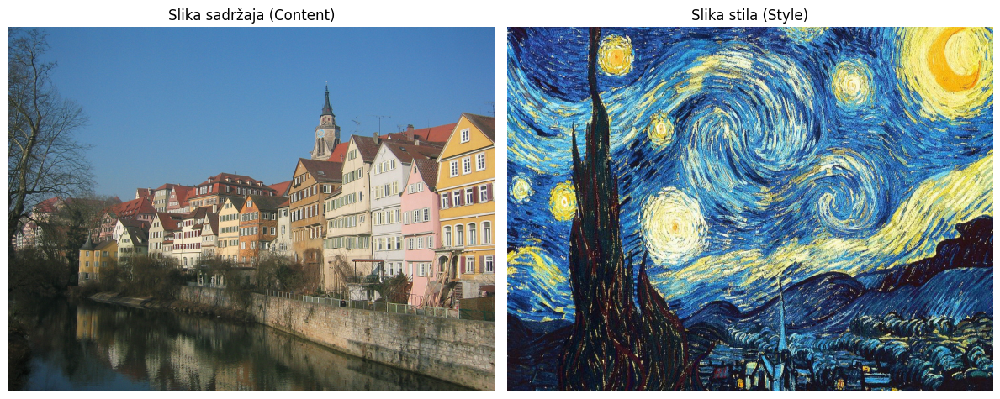

In [ ]:
########################################################################################################################
# 1. UČITAVANJE I PROCESIRANJE SLIKA
########################################################################################################################

target_shape = (768, 1024) # (480, 640)

def load_image(url, max_size=400, shape=None):
    """Preuzima sliku sa neta i formatira je za VGG19."""
    response = requests.get(url)
    image = Image.open(BytesIO(response.content)).convert('RGB')

    # Smanjivanje slike radi bržeg procesiranja
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)

    if shape is not None:
        size = shape

    in_transform = transforms.Compose([
        transforms.Resize((size, int(size * image.size[0] / image.size[1])) if shape is None else shape),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406),
                             (0.229, 0.224, 0.225))])

    # Dodavanje batch dimenzije
    image = in_transform(image)[:3, :, :].unsqueeze(0)
    return image.to(device)

def im_convert(tensor):
    """Pomoćna funkcija za denormalizaciju i prikaz tenzora kao slike."""
    image = tensor.cpu().clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1, 2, 0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)
    return image

# URL-ovi za test slike (slobodne za korišćenje)
content_url = "https://raw.githubusercontent.com/jcjohnson/neural-style/master/examples/inputs/tubingen.jpg"
style_url = "https://raw.githubusercontent.com/jcjohnson/neural-style/master/examples/inputs/starry_night.jpg"

# Učitavanje content slike
content = load_image(content_url, shape=target_shape)
# Učitavanje style slike (mora imati iste dimenzije kao content slika)
style = load_image(style_url, shape=content.shape[-2:])

# Prikaz učitanih slika pre početka optimizacije
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Koristimo već definisanu funkciju im_convert za vraćanje tenzora u sliku
ax1.imshow(im_convert(content))
ax1.set_title("Slika sadržaja (Content)")
ax1.axis('off')

ax2.imshow(im_convert(style))
ax2.set_title("Slika stila (Style)")
ax2.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
########################################################################################################################
# 2. UČITAVANJE VGG19 MODELA
########################################################################################################################

# Preuzimamo samo feature ekstrakcioni deo VGG19 (bez klasifikacionih slojeva) i zamrzavamo težine
vgg = models.vgg19(weights=VGG19_Weights.DEFAULT).features
for param in vgg.parameters():
    param.requires_grad_(False)
vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [ ]:
########################################################################################################################
# 3. POMOĆNE FUNKCIJE ZA EKSTRAKCIJU FEATURE-A I GRAM MATRICE
########################################################################################################################

def get_features(image, model, layers=None):
    """Propagira sliku kroz VGG i čuva izlaze ciljanih slojeva."""
    if layers is None:
        # Standardni slojevi iz Gatys et al. 2016
        layers = {
            '0': 'conv1_1',
            '5': 'conv2_1',
            '10': 'conv3_1',
            '19': 'conv4_1',
            '21': 'conv4_2', # Očekivano za content representation
            '28': 'conv5_1'
        }

    features = {}
    x = image
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
    return features

def gram_matrix(tensor):
    """Računa Gramovu matricu i normalizuje je veličinom sloja."""
    _, d, h, w = tensor.size()
    tensor = tensor.view(d, h * w)
    gram = torch.mm(tensor, tensor.t())

    # Normalizacija same matrice pre računanja loss-a
    return gram / (d * h * w)

# Ekstrakcija feature-a za bazne slike
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

print("="*20 + " DIMENZIJE FEATURE MAPA " + "="*20)
print(f"{'Sloj':<10} | {'Content Shape':<25} | {'Style Shape':<25}")
print("-"*74)
for layer in content_features:
    c_shape = str(list(content_features[layer].shape))
    s_shape = str(list(style_features[layer].shape))
    print(f"{layer:<10} | {c_shape:<25} | {s_shape:<25}")

# Računanje Gram matrica za stil
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

print("\n" + "="*20 + " DIMENZIJE GRAMOVIH MATRICA " + "="*20)
print(f"{'Sloj':<10} | {'Gram Matrix Shape':<25}")
print("-"*40)
for layer, gram in style_grams.items():
    g_shape = str(list(gram.shape))
    print(f"{layer:<10} | {g_shape:<25}")
print("="*64 + "\n")

==================== DIMENZIJE FEATURE MAPA ====================
Sloj       | Content Shape             | Style Shape              
--------------------------------------------------------------------------
conv1_1    | [1, 64, 768, 1024]        | [1, 64, 768, 1024]       
conv2_1    | [1, 128, 384, 512]        | [1, 128, 384, 512]       
conv3_1    | [1, 256, 192, 256]        | [1, 256, 192, 256]       
conv4_1    | [1, 512, 96, 128]         | [1, 512, 96, 128]        
conv4_2    | [1, 512, 96, 128]         | [1, 512, 96, 128]        
conv5_1    | [1, 512, 48, 64]          | [1, 512, 48, 64]         

==================== DIMENZIJE GRAMOVIH MATRICA ====================
Sloj       | Gram Matrix Shape        
----------------------------------------
conv1_1    | [64, 64]                 
conv2_1    | [128, 128]               
conv3_1    | [256, 256]               
conv4_1    | [512, 512]               
conv4_2    | [512, 512]               
conv5_1    | [512, 512]               



Počinjemo style transfer sa L-BFGS optimizatorom...

Epoha [100/500] | Total Loss: 1.5346e+01
-> Content Component: 9.0275e+00
-> Style Component:   1.7097e+00
-> TV Component:      4.6086e+00


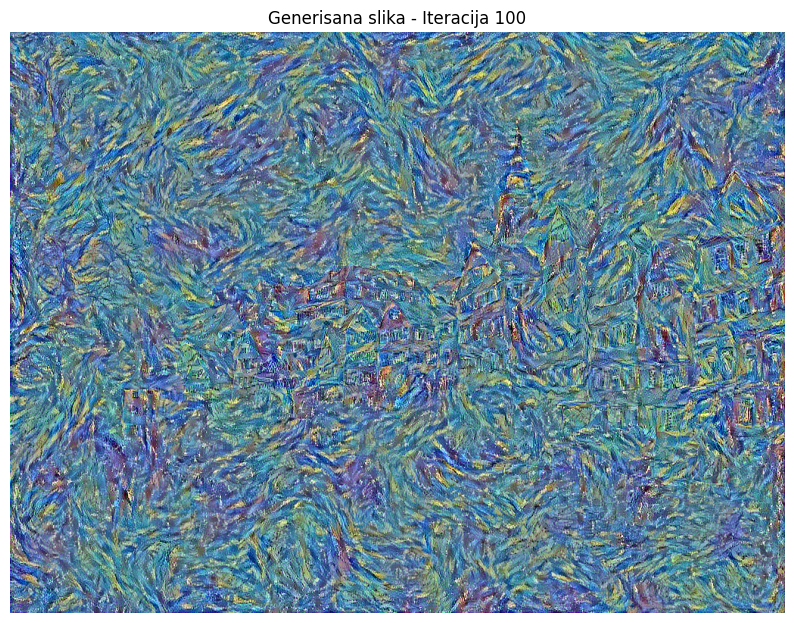


Epoha [200/500] | Total Loss: 1.2566e+01
-> Content Component: 7.0935e+00
-> Style Component:   1.4366e+00
-> TV Component:      4.0358e+00


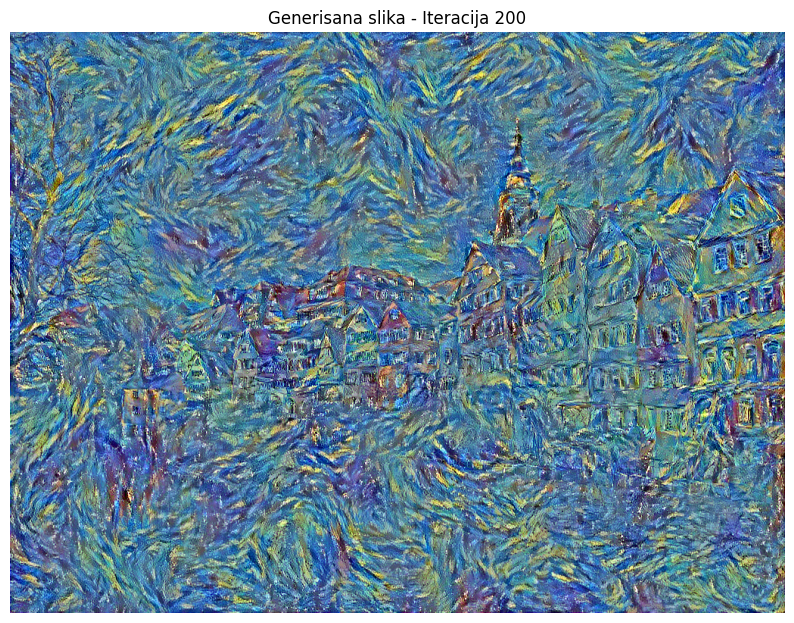


Epoha [300/500] | Total Loss: 1.1766e+01
-> Content Component: 6.5422e+00
-> Style Component:   1.3407e+00
-> TV Component:      3.8833e+00


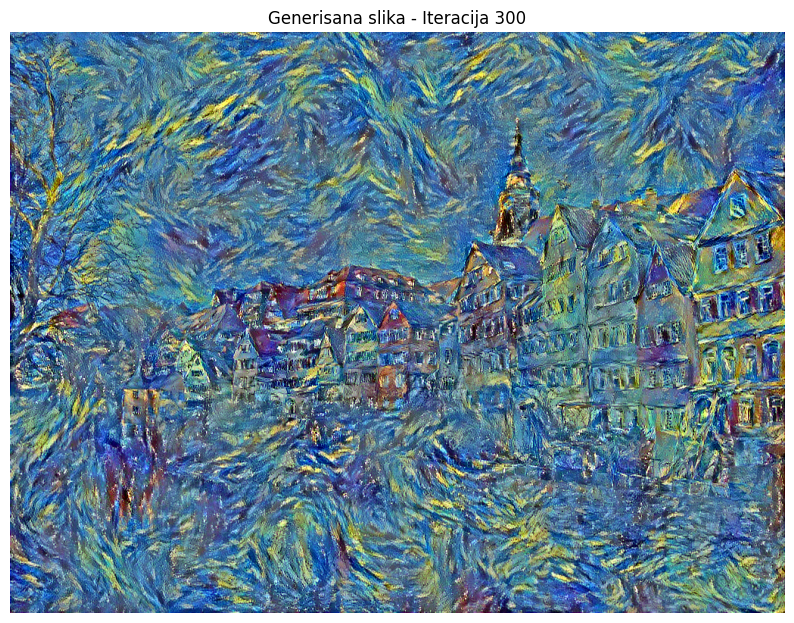


Epoha [400/500] | Total Loss: 1.1402e+01
-> Content Component: 6.3009e+00
-> Style Component:   1.2961e+00
-> TV Component:      3.8050e+00


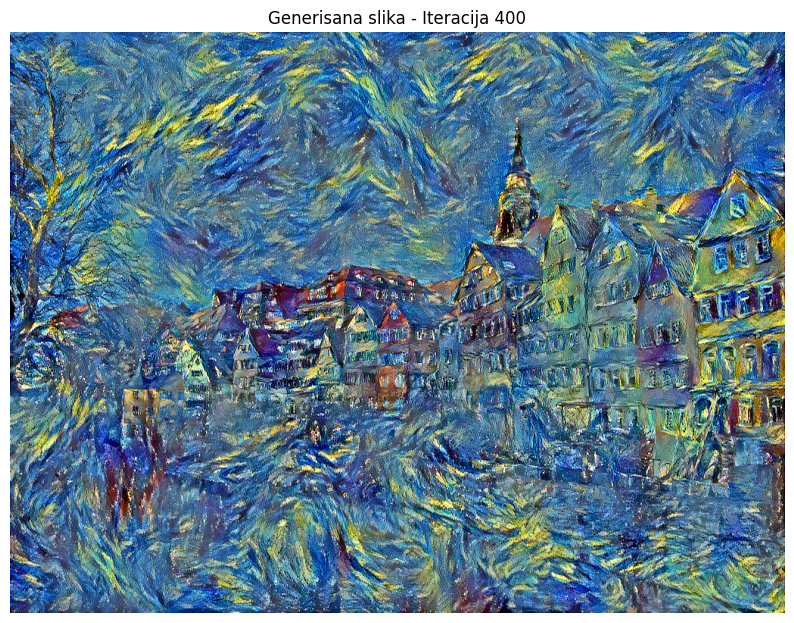


Epoha [500/500] | Total Loss: 1.1214e+01
-> Content Component: 6.1745e+00
-> Style Component:   1.2774e+00
-> TV Component:      3.7622e+00


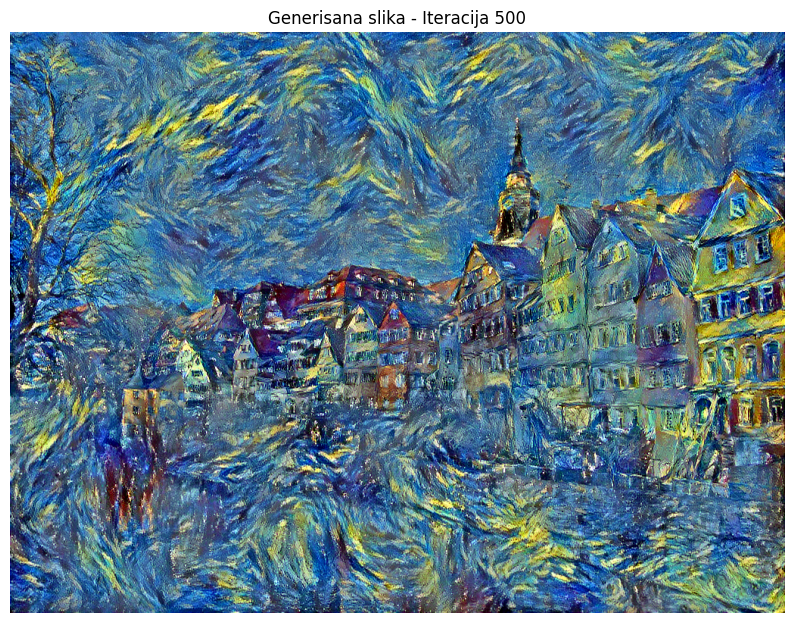

In [ ]:
########################################################################################################################
# 4. PETLJA OPTIMIZACIJE (STYLE TRANSFER)
########################################################################################################################

# Težine za svaki sloj stila (češće se daje veći prioritet dubljim slojevima)
style_weights = {
    'conv1_1': 0.2,   # Vraća sitnu teksturu ulja na platnu
    'conv2_1': 0.4,   # Potezi srednje veličine
    'conv3_1': 0.8,   # Formiranje manjih poteza
    'conv4_1': 1.0,   # Glavni sloj za Van Gogove kovitlace
    'conv5_1': 1.0    # Globalni raspored stila
}

# Težinski faktori za balansiranje sadržaja i stila (alfa i beta)
content_weight = 1  # alfa
style_weight = 1e6  # beta
tv_weight    =   5  # peglanje slike

# Pravimo tenzor nasumičnog šuma u opsegu [0, 1] pa ga zatim normalizujemo
target = torch.randn_like(content).uniform_(0, 1).to(device)
target = (target - torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1).to(device)) / torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1).to(device)
target.requires_grad_(True)

# L-BFGS optimizator (Gatys 2016)
optimizer = optim.LBFGS([target], max_iter=1)

# Broj iteracija
epochs = 500
show_every = 100

def total_variation_loss(img):
    """Računa razliku između susednih piksela kako bi se smanjio šum."""
    # img je oblika (1, C, H, W)
    tv_h = torch.mean((img[:, :, 1:, :] - img[:, :, :-1, :])**2)
    tv_w = torch.mean((img[:, :, :, 1:] - img[:, :, :, :-1])**2)
    return tv_h + tv_w

print("Počinjemo style transfer sa L-BFGS optimizatorom...")

# Rečnik u koji ćemo skladištiti tekuće vrednosti loss-a unutar closure-a
current_losses = {'total': 0.0, 'content': 0.0, 'style': 0.0, 'tv': 0.0}

for ii in range(1, epochs + 1):

    def closure():
        optimizer.zero_grad()
        target_features = get_features(target, vgg)

        # Content loss
        # --- računamo MSE za dva sloja
        loss_c4 = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
        loss_c3 = torch.mean((target_features['conv3_1'] - content_features['conv3_1'])**2)
        # --- plići sloj (conv3_1) će sačuvati strukturu cigli, prozora i oštrih linija
        content_loss = 0.8 * loss_c4 + 0.2 * loss_c3

        # Style loss
        style_loss = 0
        for layer in style_weights:
            target_feature = target_features[layer]
            target_gram = gram_matrix(target_feature)
            style_gram = style_grams[layer]

            layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
            style_loss += layer_style_loss

        # TV loss
        tv_loss = total_variation_loss(target)

        # Total loss
        total_loss = content_weight * content_loss + style_weight * style_loss + tv_weight * tv_loss
        total_loss.backward()

        # Pakujemo .item() vrednosti u rečnik da budu dostupne van closure-a
        current_losses['total'] = total_loss.item()
        current_losses['content'] = (content_weight * content_loss).item()
        current_losses['style'] = (style_weight * style_loss).item()
        current_losses['tv'] = (tv_weight * tv_loss).item()

        return total_loss

    # Korak optimizatora (poziva closure)
    optimizer.step(closure)

    # Prikaz napretka
    if ii % show_every == 0:
        print(f"\n" + "="*60)
        print(f"Epoha [{ii}/{epochs}] | Total Loss: {current_losses['total']:.4e}")
        print(f"-> Content Component: {current_losses['content']:.4e}")
        print(f"-> Style Component:   {current_losses['style']:.4e}")
        print(f"-> TV Component:      {current_losses['tv']:.4e}")
        print("="*60)

        plt.figure(figsize=(10, 8))
        plt.imshow(im_convert(target))
        plt.title(f"Generisana slika - Iteracija {ii}")
        plt.axis('off')
        plt.show()

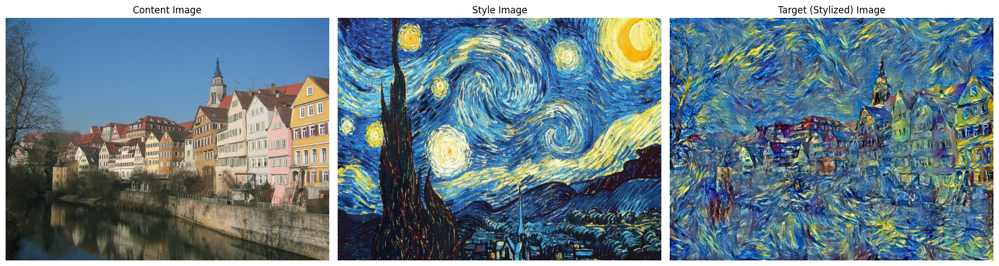

In [ ]:
########################################################################################################################
# 5. PRIKAZ I SNIMANJE REZULTATA
########################################################################################################################

target_img_np = im_convert(target)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

ax1.imshow(im_convert(content))
ax1.set_title("Content Image")
ax1.axis('off')

ax2.imshow(im_convert(style))
ax2.set_title("Style Image")
ax2.axis('off')

ax3.imshow(im_convert(target))
ax3.set_title("Target (Stylized) Image")
ax3.axis('off')

plt.tight_layout()
plt.show()

########################################################################################################################
# SNIMANJE SLIKE U PUNOJ REZOLUCIJI

# Množimo sa 255 da bismo prešli iz [0, 1] opsega u standardni [0, 255] RGB prostor
target_img_uint8 = (target_img_np * 255).astype(np.uint8)

# Kreiranje PIL objekta i čuvanje fajla
output_filename = "stylized_output.png"
Image.fromarray(target_img_uint8).save(output_filename)